###### Before training the sales model, predict missing transactions for test dates (2017-08-16 to 2017-08-31).

###### Transactions are a key feature for predicting sales, so filling in these missing values ensures the test dataset has realistic transaction data, preventing zeros or missing values from hurting sales prediction accuracy.

In [1]:
# Azure ML notebook env library installation
%pip install statsmodels
%pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [2]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import os
import warnings
warnings.filterwarnings("ignore")

# Create folder to save each SARIMA model/store graphs
folder_name = "SARIMA-Graphs"
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

In [3]:
# Reading transactions data
transactions = pd.read_csv("transactions.csv")
transactions['date'] = pd.to_datetime(transactions['date'])
transactions.rename(columns={'store_nbr': 'Store', 'transactions':'Transactions'}, inplace=True)

In [4]:
# Reading preprosessed train and test data to merge with the updated transactions
train = pd.read_csv("train_merged_0.csv")
train['date'] = pd.to_datetime(train['date'])

test = pd.read_csv("test_merged_0.csv")
test['date'] = pd.to_datetime(test['date'])

### Grid Search SARIMA

###### Using SARIMA to predict transactions (in a way we can call this step a feature extraction).
###### There is one SARIMA model per store.
###### Hypertuning SARIMA using grid search.
###### Grid search tests all candidate SARIMA orders (checking for both non-seasonality and seasonality).
###### Grid search evaluates best SARIMA model per store using Akaike Information Criterion (AIC), keeping track of the best (p, d, q) order with the lowest AIC.


In [5]:
# Defining functions to be used

# Function to evaluate a single SARIMA model and return its AIC
def evaluate_sarima_model(time_series_log, order, seasonal_order):
    try:
        model = SARIMAX(
            time_series_log,
            order=order,
            seasonal_order=seasonal_order,
            enforce_stationarity=False,
            enforce_invertibility=False,
        )
        model_fit = model.fit(maxiter=200, disp=False)
        return model_fit.aic  # Akaike Information Criterion
    except Exception:
        return np.inf  # Return a high value if the model fails

# Function to perform grid search for SARIMA parameters
def grid_search_sarima(time_series_log, p_values, d_values, q_values, P_values, D_values, Q_values, seasonal_periods):
    best_aic = np.inf
    best_order = None
    best_seasonal_order = None

    for p in p_values:
        for d in d_values:
            for q in q_values:
                for P in P_values:
                    for D in D_values:
                        for Q in Q_values:
                            for m in seasonal_periods:
                                order = (p, d, q)
                                seasonal_order = (P, D, Q, m)
                                # print("Non-Seasonal combo:", order, "Seasonal combo:", seasonal_order)
                                aic = evaluate_sarima_model(time_series_log, order, seasonal_order)
                                if aic < best_aic:
                                    best_aic = aic
                                    best_order = order
                                    best_seasonal_order = seasonal_order
    print("Best Non-Seasonal combination: ", best_order)
    print("Best Seasonal combination: ", best_seasonal_order)
    print(f"Lowest AIC score: ", best_aic,'\n')
    return best_order, best_seasonal_order

In [6]:
# Dates to be forecasted
forecast_days = 16
forecast_start = pd.to_datetime('2017-08-16')
forecast_list = []
model_pred_list = []

# Define SARIMA parameter grid
p_values = [0, 1]        # Non-seasonal AR order
d_values = [0, 1]        # Non-seasonal differencing
q_values = [0, 1]        # Non-seasonal MA order

P_values = [0, 1]        # Seasonal AR order
D_values = [0, 1]        # Seasonal differencing
Q_values = [0, 1]        # Seasonal MA order

seasonal_periods = [7, 12]  # Try weekly and monthly seasonality

In [7]:
# Loop through each store to create the model
for store_id in transactions['Store'].unique():
    print(f"\nProcessing store: {store_id}")
    store_ts = transactions[transactions['Store'] == store_id].set_index('date')['Transactions']
    store_ts = store_ts.sort_index().asfreq('D')

    # Apply log transformation to stabilize variance and handle zeros
    store_ts_log = np.log1p(store_ts)

    # Perform SARIMA grid search
    best_order, best_seasonal_order = grid_search_sarima(
        store_ts_log, p_values, d_values, q_values, P_values, D_values, Q_values, seasonal_periods
    )

    if best_order is None or best_seasonal_order is None:
        print(f"No suitable SARIMA model found for store {store_id}. Skipping.")
        continue

    # Fit SARIMA model using the best parameters from grid search
    model = SARIMAX(
        store_ts_log,
        order=best_order,
        seasonal_order=best_seasonal_order,
        enforce_stationarity=False,
        enforce_invertibility=False,
    )
    model_fit = model.fit(maxiter=200, disp=False)

    # Forecast and reverse the transformation
    forecast_log = model_fit.forecast(steps=forecast_days)
    forecast = np.expm1(forecast_log)

    forecast_dates = pd.date_range(start=forecast_start, periods=forecast_days)
    store_forecast_df = pd.DataFrame({
        'date': forecast_dates,
        'Store': store_id,
        'Transactions': forecast
    })
    forecast_list.append(store_forecast_df)

    # Predicting transactions for existing data to check accuracy
    pred_log = model_fit.predict(start=store_ts_log.index[0], end=store_ts_log.index[-1])
    predicted_train = np.expm1(pred_log)

    store_train_pred_df = pd.DataFrame({
        'date': predicted_train.index,
        'Store': store_id,
        'Transactions': predicted_train.values
    })
    model_pred_list.append(store_train_pred_df)


Processing store: 25
Best Non-Seasonal combination:  (1, 0, 1)
Best Seasonal combination:  (1, 1, 1, 7)
Lowest AIC score:  -1786.2721346045428 


Processing store: 1
Best Non-Seasonal combination:  (1, 0, 0)
Best Seasonal combination:  (0, 1, 1, 7)
Lowest AIC score:  -133.43289248950555 


Processing store: 2
Best Non-Seasonal combination:  (1, 0, 1)
Best Seasonal combination:  (1, 0, 1, 7)
Lowest AIC score:  -2089.032450484688 


Processing store: 3
Best Non-Seasonal combination:  (1, 0, 1)
Best Seasonal combination:  (1, 1, 1, 7)
Lowest AIC score:  -4334.972484545897 


Processing store: 4
Best Non-Seasonal combination:  (1, 0, 1)
Best Seasonal combination:  (1, 1, 1, 7)
Lowest AIC score:  -3669.4105716018153 


Processing store: 5
Best Non-Seasonal combination:  (1, 1, 1)
Best Seasonal combination:  (1, 1, 1, 7)
Lowest AIC score:  -3470.814351260795 


Processing store: 6
Best Non-Seasonal combination:  (1, 0, 1)
Best Seasonal combination:  (1, 1, 1, 7)
Lowest AIC score:  -3704.032

In [8]:
# Forecast results
# Combine all forecasts into a single DataFrame
forecast_df = pd.concat(forecast_list, ignore_index=True)

# Put negative forecasts to zero (transactions can't be negative)
forecast_df['Transactions'] = forecast_df['Transactions'].clip(lower=0)

# Round down to the nearest integer
forecast_df['Transactions'] = np.floor(forecast_df['Transactions']).astype('int64')

# Predictions results
model_pred_df = pd.concat(model_pred_list, ignore_index=True)
model_pred_df['Transactions'] = model_pred_df['Transactions'].clip(lower=0)
model_pred_df['Transactions'] = np.floor(model_pred_df['Transactions']).astype('int64')

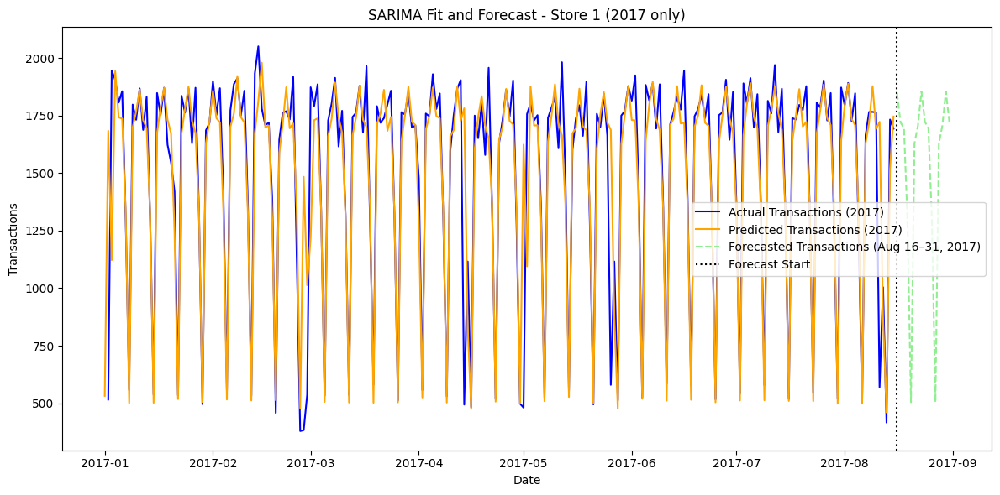

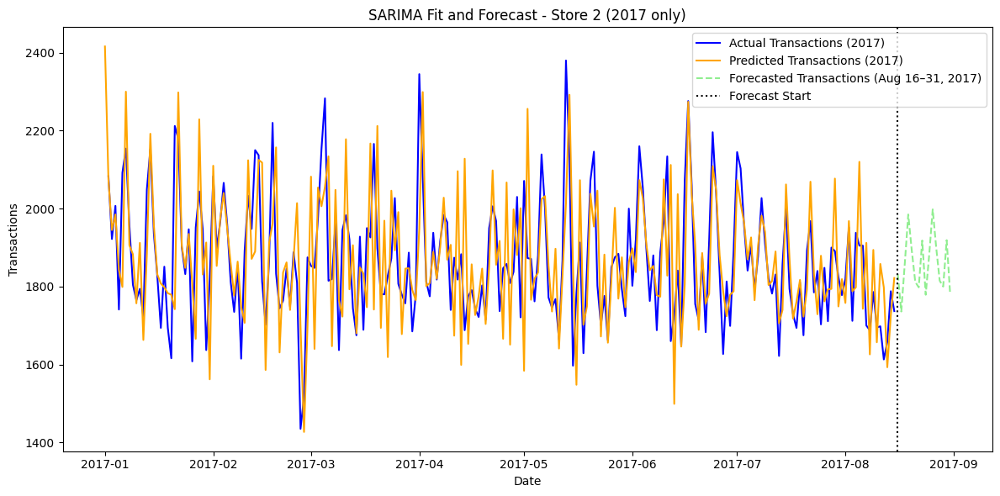

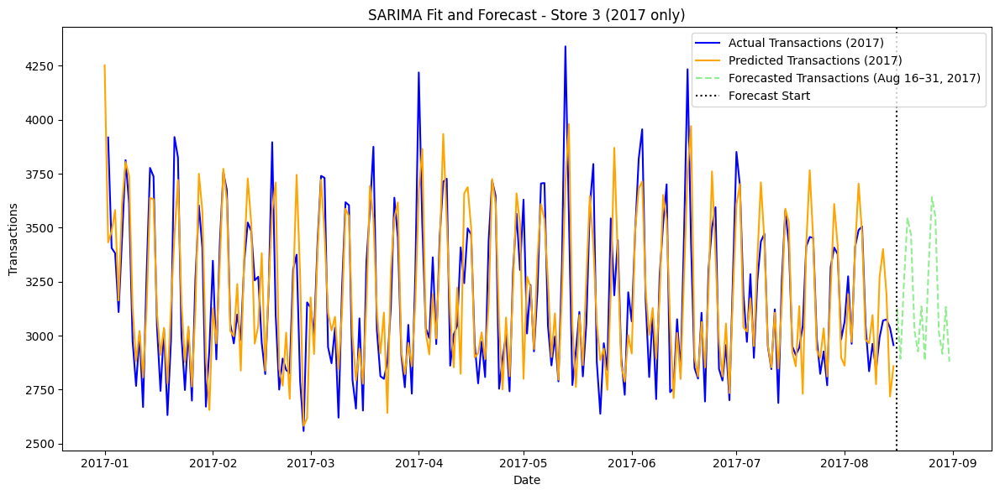

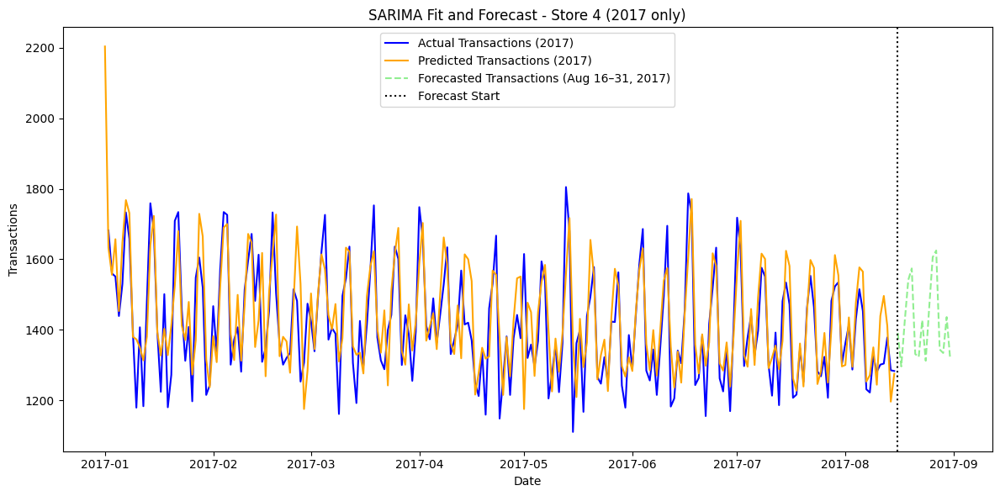

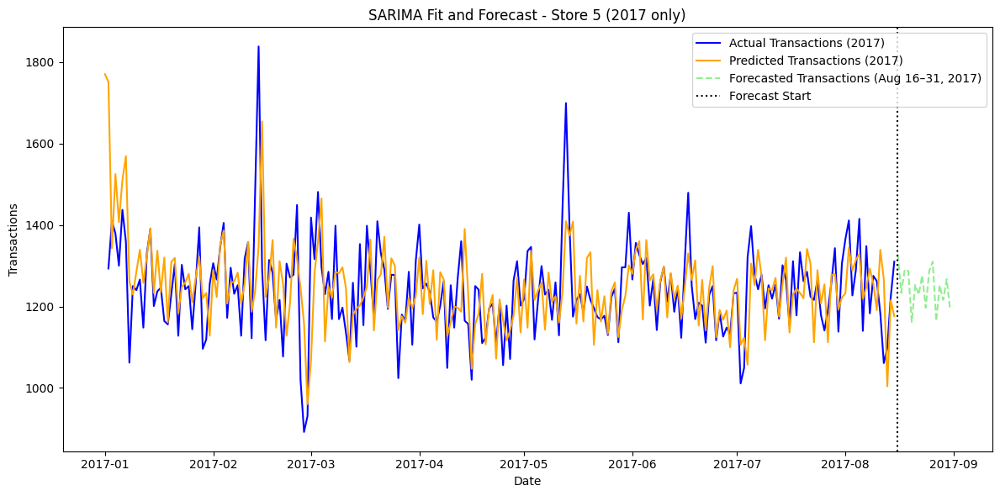

...

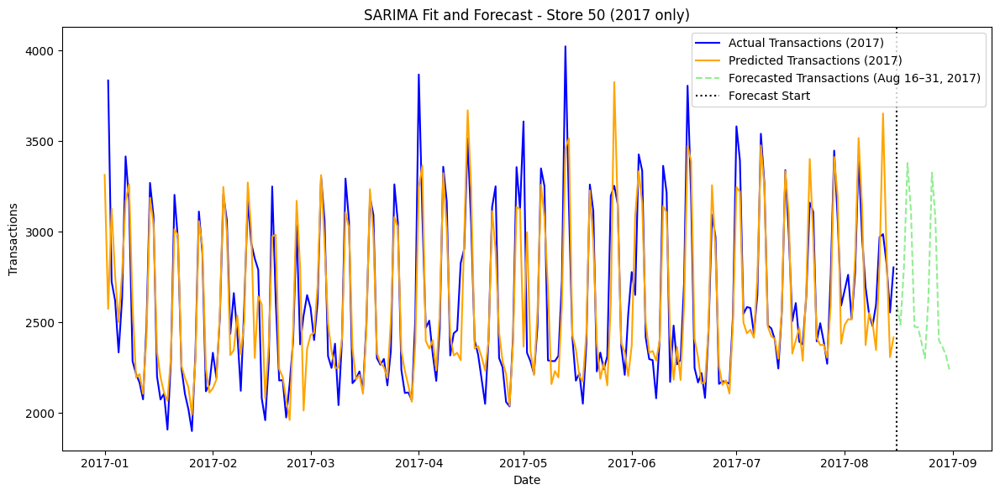

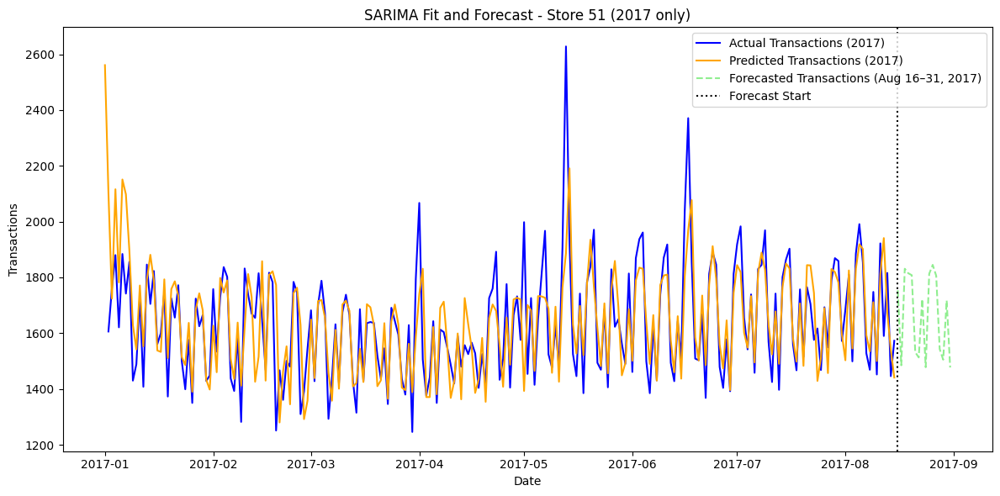

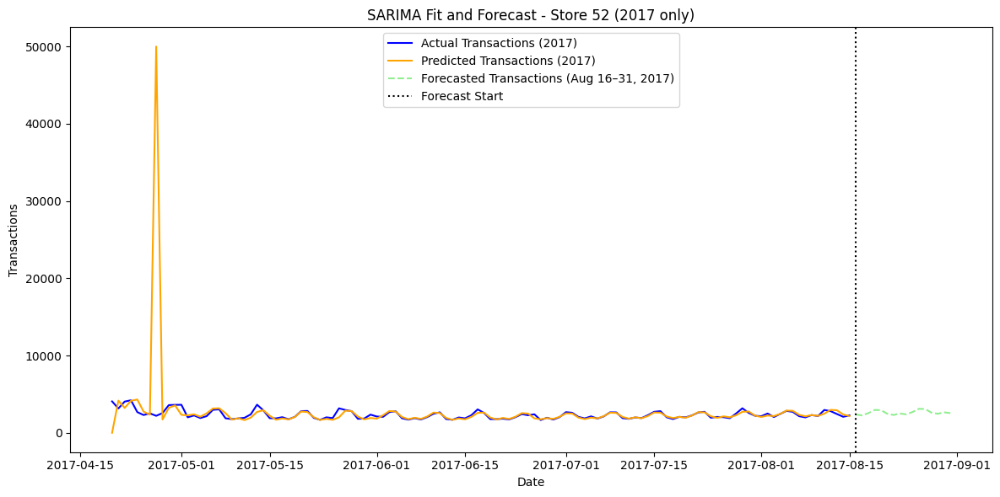

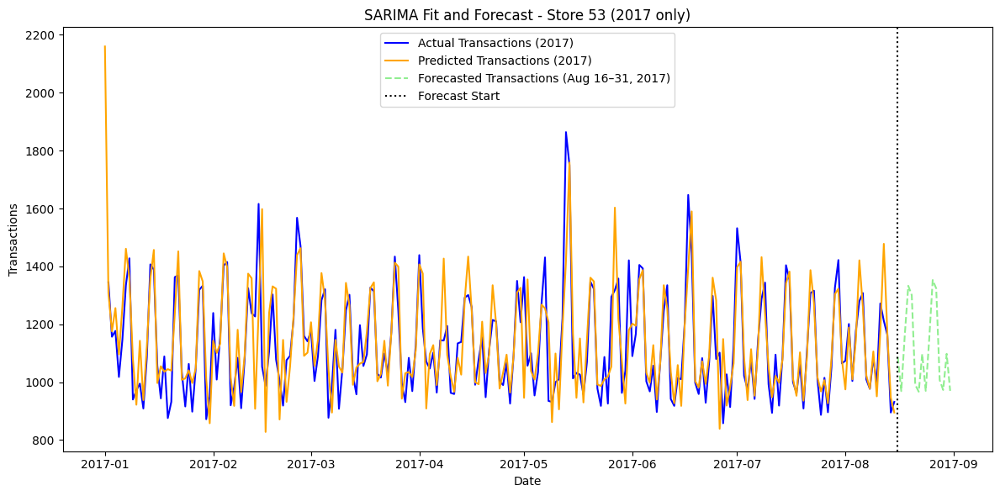

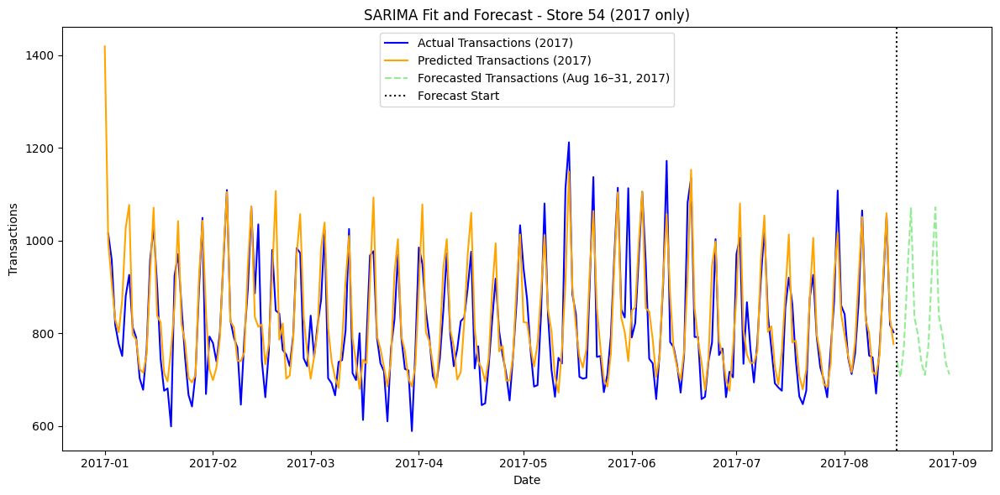

In [9]:
stores = sorted(transactions['Store'].unique())

for store_id in stores:
    actual = transactions[transactions['Store'] == store_id].set_index('date')['Transactions']
    predicted_train = model_pred_df[model_pred_df['Store'] == store_id].set_index('date')['Transactions']
    forecasted = forecast_df[forecast_df['Store'] == store_id].set_index('date')['Transactions']

    # Filter for the year 2017 only
    actual_2017 = actual['2017-01-01':]
    predicted_2017 = predicted_train['2017-01-01':]
    predicted_2017 = predicted_2017.clip(upper=50000) # Normal data range from 1 to 4 digits, 
                                                    # if there are very big outliers (5-6 digits) make it smaller to have smaller scale
                                                    # in graph to compare values, but to still show as an outlier. 
    forecasted_2017 = forecasted['2017-01-01':]

    plt.figure(figsize=(12, 6))
    plt.plot(actual_2017.index, actual_2017.values, label='Actual Transactions (2017)', color='blue')
    plt.plot(predicted_2017.index, predicted_2017.values, label='Predicted Transactions (2017)', color='orange')
    plt.plot(forecasted_2017.index, forecasted_2017.values, label='Forecasted Transactions (Aug 16–31, 2017)', color='lightgreen', linestyle='--')
    plt.axvline(x=forecast_start, color='black', linestyle=':', label='Forecast Start')
    plt.title(f"SARIMA Fit and Forecast - Store {store_id} (2017 only)")
    plt.xlabel("Date")
    plt.ylabel("Transactions")
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{folder_name}/SARIMA_Visual_Validation_Store{store_id}.png", dpi=300)
    plt.show()

In [10]:
# Append forecasted transactions to original transactions
transactions = pd.concat([transactions, forecast_df], ignore_index=True)
transactions = transactions.sort_values(['date', 'Store']).reset_index(drop=True)

In [11]:
print(transactions['Transactions'].value_counts())

Transactions
1207    91
1200    87
1304    82
1229    82
1171    81
        ..
5157     1
4718     1
5076     1
5102     1
4155     1
Name: count, Length: 4998, dtype: int64


In [12]:
# Merge transactions with train and test to be used as feature in sales forecasting
train_merged = train.merge(transactions, on=["Store","date"], how="left")
test_merged = test.merge(transactions, on=["Store","date"], how="left")

# If transaction is NaN after merge than it means there were no sales done that day so fill value with 0
train_merged['Transactions'] = train_merged['Transactions'].fillna(0).astype('int64')
test_merged['Transactions'] = test_merged['Transactions'].fillna(0).astype('int64')

In [13]:
print(train_merged['Transactions'].value_counts())
print(test_merged['Transactions'].value_counts())

print(train_merged['Transactions'].isnull().sum())
print(test_merged['Transactions'].isnull().sum())

Transactions
0       252912
1207      2970
1200      2838
1304      2673
1171      2640
         ...  
4646        33
4520        33
4220        33
4590        33
4392        33
Name: count, Length: 4994, dtype: int64
Transactions
1162    132
774     132
1408    132
1073    132
820     132
       ... 
847      33
1570     33
892      33
2032     33
711      33
Name: count, Length: 692, dtype: int64
0
0


In [14]:
# Save new datasets to file
transactions.to_csv('transactions_updated.csv', index=False)
train_merged.to_csv('train_merged.csv', index=False)
test_merged.to_csv('test_merged.csv', index=False)

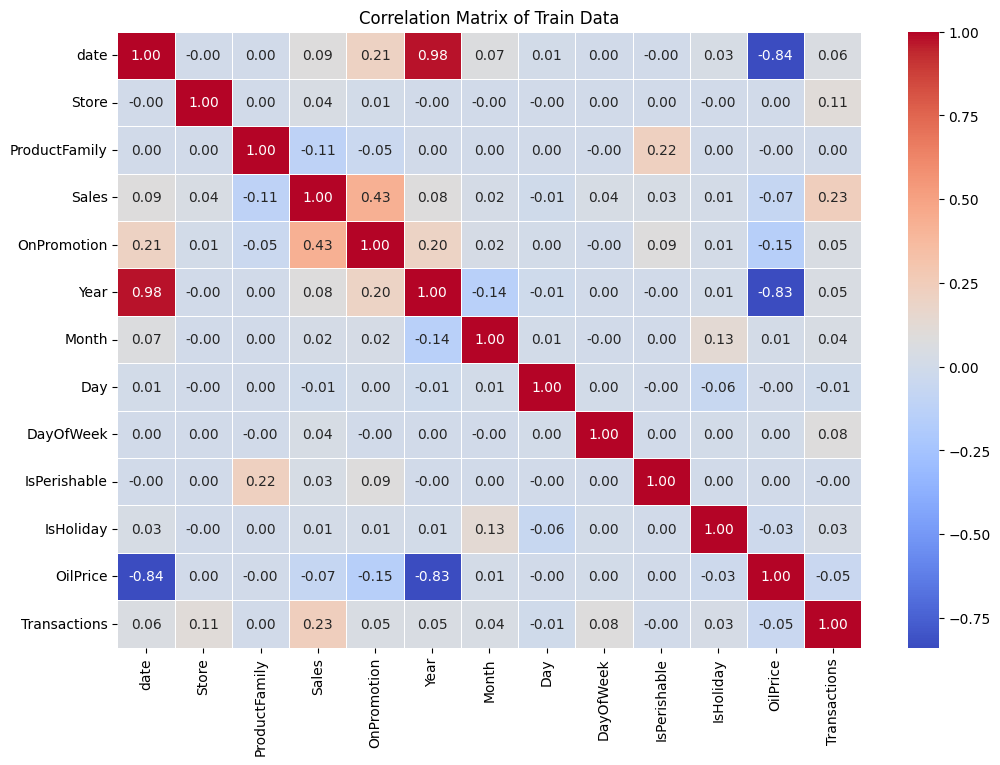

In [5]:
# Plot correlation matrix
le = LabelEncoder()
for col in train_merged.select_dtypes(include='object').columns:
    train_merged[col] = le.fit_transform(train_merged[col])

correlation_matrix = train_merged.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', cbar=True, linewidths=0.5)
plt.title("Correlation Matrix of Train Data")
plt.savefig("Correlation_Matrix_Train_Data.png")
plt.show()